# Unsupervised Learning and Clustering: Part 1


## Some Clustering Tasks

- Customer segmentation

- Data Analysis

- Dimensionality reduction

- Feature engineering

- Anomaly detection

- Semi-supervised learning

- Search engine

- Image segmentation

## This notebook:

### k-means basics:

- k-means from scratch on `make_blobs` data
- k-means using Scikit-Learn
- Visualize iterations of the method
- Choosing $k$: Elbows, Silhouette score, and silhouette plots

### k-means applications

- Image color segmentation
    - Example on satellite data
- Semi-supervised learning
    - Example on number classification

### Algorithm:

1. Randomly assign observations to cluster
2. Find centroids
3. Reassign based on membership
4. Iterate 2 and 3

We'll make our own class for k-means:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from sklearn.datasets import make_blobs

#Make some blobs:
#Taken directly from Hands-On Machine Learing by Geron:
blob_centers = np.array([[ 0.2,  2.3], [-1.5 ,  2.3], [-2.8,  1.8],
                         [-2.8,  2.8], [-2.8,  1.3]])

blob_std = np.array([0.4, 0.3, 0.1, 0.1, 0.1])

#X and y:
#y is blob membership
X, y = make_blobs(n_samples=2000, centers=blob_centers, cluster_std=blob_std,
                  random_state=42)

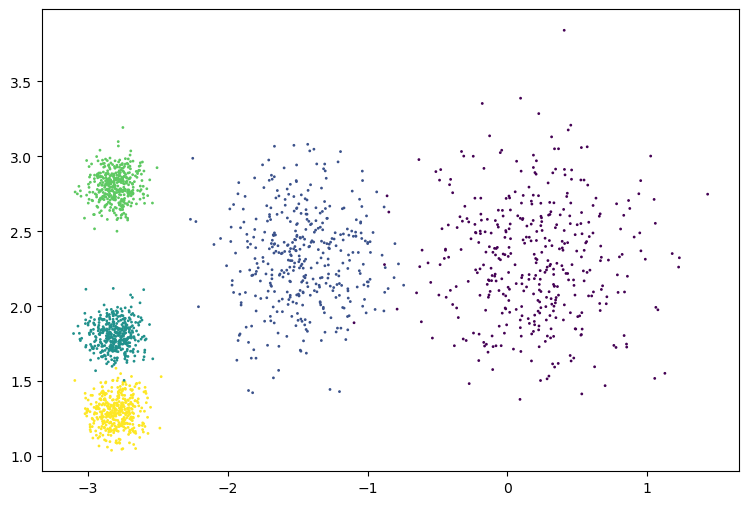

In [4]:
#Check our blobs:
fig, ax1 = plt.subplots(1,1, figsize=(9,6))

ax1.scatter(X[:,0], X[:,1], s=1, c=y);

In [5]:
##K-Means clustering from scratch:
###########


In [6]:
#We'll want this in a sec:
#######

def plot_centroids(ax, centroids, scale_factor=1, alpha_factor=1):

    ax.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=45*scale_factor, linewidths=8*scale_factor,
                color='black', zorder=10, alpha=0.8*alpha_factor)
    
    ax.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=35*scale_factor, linewidths=8*scale_factor,
                color='white', zorder=10, alpha=0.9*alpha_factor)
    
    ax.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=2*scale_factor, linewidths=12*scale_factor,
                c = range(len(centroids)), zorder=11, alpha=1*alpha_factor, cmap='jet')

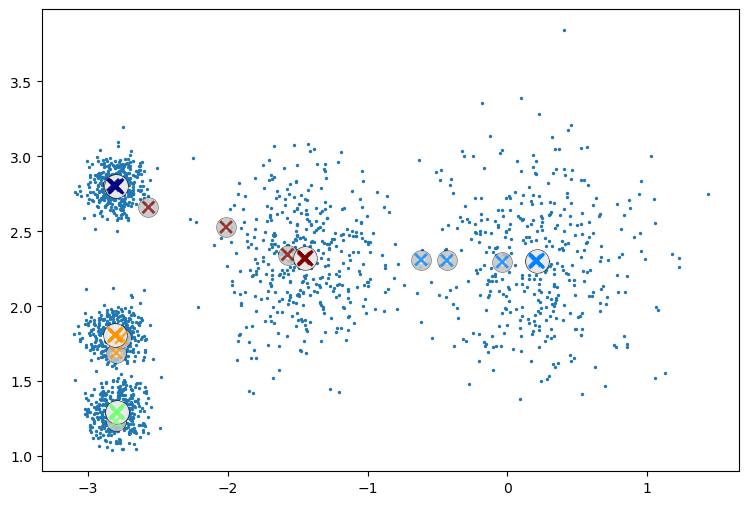

In [7]:
#Run the algorithm outside the class here:
######

#Let's also plot the evolution of the clusters:
fig, ax1 = plt.subplots(1,1, figsize=(9,6))

#Blobs:
ax1.scatter(X[:,0], X[:,1], s=2);


#np.random.seed(42)

n_clusters = 5

i = np.random.choice(len(X), n_clusters, replace=False)
        
#Initial centers:
centers = X[i]

#Assign each observation to a cluster
#Use np.random.choice again:
cluster_id = np.random.choice(n_clusters, len(X), replace=True)

num_iters = 10

#Now iteratively update centers:
for iter in range(num_iters):
    #Get distance to centers for each observation:

    #Distances?
    d = np.zeros([len(X), n_clusters])
    for j in range(len(X)):
        d[j] = np.linalg.norm(X[j,:] - centers, axis=1)

    #Get the closest center for each observation:
    closest = np.argmin(d, axis=1)

    #Reassign membership to closest center:
    cluster_id = closest

    #Recalculate centers:
    for j in range(n_clusters):
        centers[j] = X[cluster_id == j].mean(axis=0)
        
        
    #Plot clusters at this iteration
    plot_centroids(ax1, centers, alpha_factor=.75)

#Plot final larger:
plot_centroids(ax1, centers, scale_factor=1.25, alpha_factor=1)

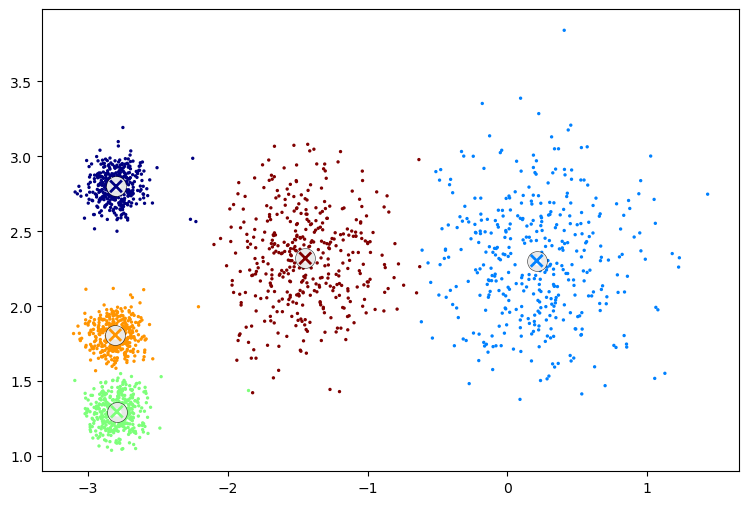

In [8]:
#Plot the final centers and observations:
#########

#Check our blobs:
fig, ax1 = plt.subplots(1,1, figsize=(9,6))

ax1.scatter(X[:,0], X[:,1], s=2, c=cluster_id, cmap='jet');

plot_centroids(ax1, centers)

In [9]:
## Now make as a class
#####

In [10]:
## Inherit the BaseEstimator from Scikit-Learn
#####

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils.validation import check_array, check_is_fitted

class MyKMeans(BaseEstimator, TransformerMixin):
    def __init__(self, n_clusters=5, num_iters=100, random_state=None):
        self.n_clusters = n_clusters
        self.num_iters = num_iters
        self.random_state = random_state
            
        
    def fit(self, X, y=None): #y is required even though it isn't used

        #Extract feature names from columns:
        if (isinstance(X, pd.DataFrame)):
            self.feature_names = np.array(X.columns)
        #If no columns, just 0 through n
        else:
            self.feature_names = np.array(range(0, X.shape[1])).astype(str)
                                          
        X = check_array(X)  # checks that X is an array with finite float values
        
        self.n_features_in_ = X.shape[1]  # every estimator stores this in fit()

        
        #Now, let's proceed with k-means:
        #Let's just get a random n_clusters observations for our initial guess:
        if (not self.random_state == None):
            np.random.seed(self.random_state)
        
        i = np.random.choice(len(X), n_clusters, replace=False)
        
        #Initial centers:
        self.centers_ = X[i]

        #Assign each observation to a cluster
        #Use np.random.choice again:
        self.cluster_id_ = np.random.choice(n_clusters, len(X), replace=True)

        #Now iteratively update centers:
        for iter in range(self.num_iters):

            #Get distance to centers for each observation:
            d = np.zeros([len(X), self.n_clusters])
            for j in range(len(X)):
                d[j] = np.linalg.norm(X[j,:] - self.centers_, axis=1)

            #Get the closest center for each observation:
            closest = np.argmin(d, axis=1)

            #Reassign membership to closest center:
            self.cluster_id_ = closest

            #Recalculate centers:
            for j in range(n_clusters):
                self.centers_[j] = X[self.cluster_id_ == j].mean(axis=0)
        
                
        return self  # always return self!

    
    def predict(self, X):
        check_is_fitted(self)  # looks for learned attributes (with trailing _)
        X = check_array(X)

        #Check that input shape matches n_features_in_
        assert self.n_features_in_ == X.shape[1]

        
        #Get distance to centers for each observation:
        d = np.zeros([len(X), self.n_clusters])
        for j in range(len(X)):
            d[j] = np.linalg.norm(X[j,:] - self.centers_, axis=1)

        #Get the closest center for each observation:
        closest = np.argmin(d, axis=1)
            
            
        #Return closest cluster center:
        return closest

    
    def get_feature_names_out(self, names=None):
        #Just return the feature names used to create:
        return self.feature_names

In [11]:
##Check that it works?
######

kmeans = MyKMeans(n_clusters=5, random_state=None)

kmeans.fit(X, y)

MyKMeans()

In [12]:
#Get predicted cluster:
y_pred = kmeans.predict(X)

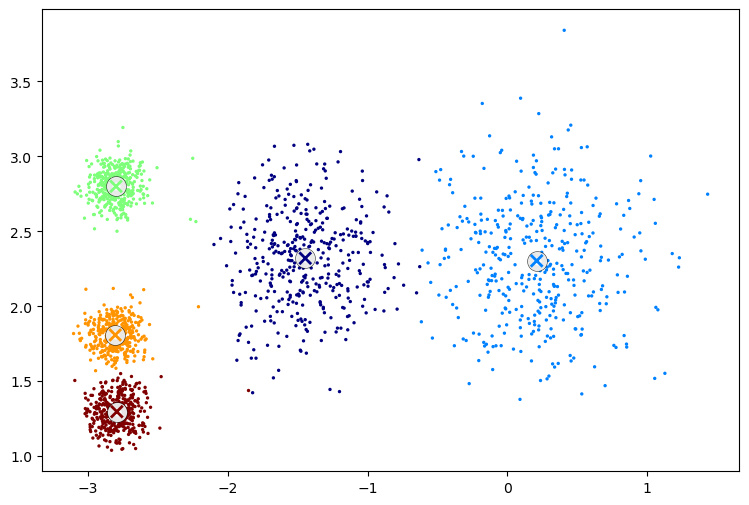

In [13]:
##Plot results:
#########

fig, ax1 = plt.subplots(1,1, figsize=(9,6))

ax1.scatter(X[:,0], X[:,1], s=2, c=y_pred, cmap='jet');

plot_centroids(ax1, kmeans.centers_)

In [14]:
## Predict a whole bunch of points:
## Make the points as before:

x1 = np.min(X[:,0]); x2 = np.max(X[:,0])
y1 = np.min(X[:,1]); y2 = np.max(X[:,1])
    
N = 500
X1, Y1 = np.meshgrid(np.linspace(x1, x2, N),
                         np.linspace(y1, y2, N))

#Get as Nx2:
XY_ravel = np.c_[X1.ravel(), Y1.ravel()]

In [15]:
#Try a few different fits:
#Use seeds: 1, 4, 9, 42
kmeans = MyKMeans(n_clusters=5, random_state=4, num_iters=20)

kmeans.fit(X, y)

MyKMeans(num_iters=20, random_state=4)

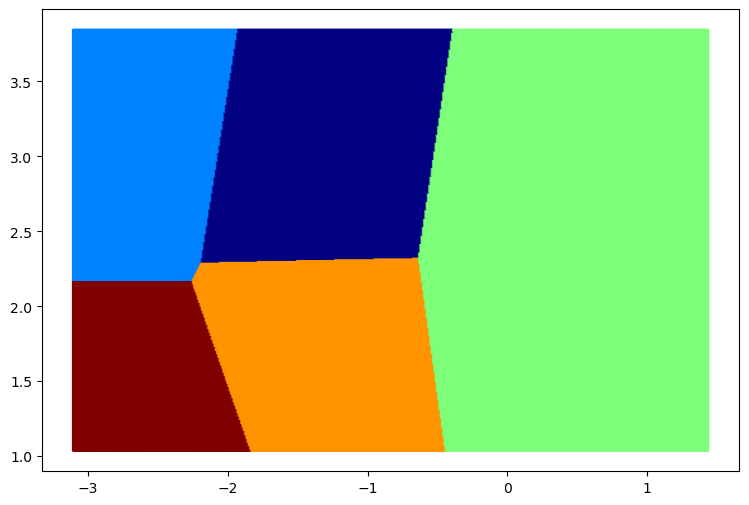

In [16]:
#Get predicted cluster:
y_pred_surface = kmeans.predict(XY_ravel)

##Plot results:
#########

fig, ax1 = plt.subplots(1,1, figsize=(9,6))
ax1.scatter(XY_ravel[:,0], XY_ravel[:,1], s=2, c=y_pred_surface, cmap='jet');


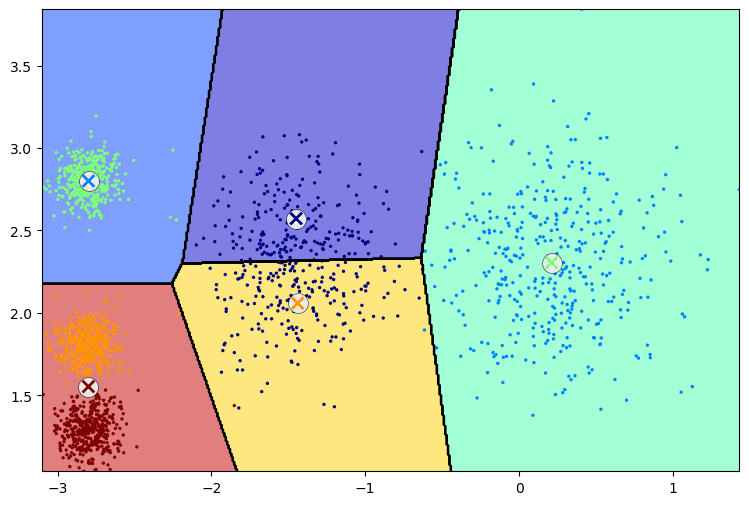

In [17]:
## Or as a pretty contour:
Z = y_pred_surface.reshape(X1.shape)


#Plot:
fig, ax1 = plt.subplots(1,1, figsize=(9,6))

ax1.contourf(X1, Y1, Z, alpha=.5, cmap='jet')
ax1.contour(X1, Y1, Z, 20, alpha=1, linewidths=1, colors='black');

ax1.scatter(X[:,0], X[:,1], s=2, c=y_pred, cmap='jet');
plot_centroids(ax1, kmeans.centers_)

## With Scikit-Learn:

- Basically same as our home-brew...

- Use `labels_` and `cluster_centers_` for cluster labels and centroids

In [18]:
##Function for contour:
def plot_contour(ax, X, kmeans, N=500):
    x1 = np.min(X[:,0]); x2 = np.max(X[:,0])
    y1 = np.min(X[:,1]); y2 = np.max(X[:,1])

    X1, Y1 = np.meshgrid(np.linspace(x1, x2, N),
                             np.linspace(y1, y2, N))

    #Get as Nx2:
    XY_ravel = np.c_[X1.ravel(), Y1.ravel()]

    y_pred_surface = kmeans.predict(XY_ravel)
    Z = y_pred_surface.reshape(X1.shape)


    ax.contourf(X1, Y1, Z, alpha=.5, cmap='jet')
    ax.contour(X1, Y1, Z, 20, alpha=1, linewidths=1, colors='black');


In [19]:
from sklearn.cluster import KMeans

k = 20
kmeans = KMeans(n_clusters=k, random_state=42)
y_pred = kmeans.fit_predict(X)

C:\Users\steff\Anaconda3\envs\ML_environment\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


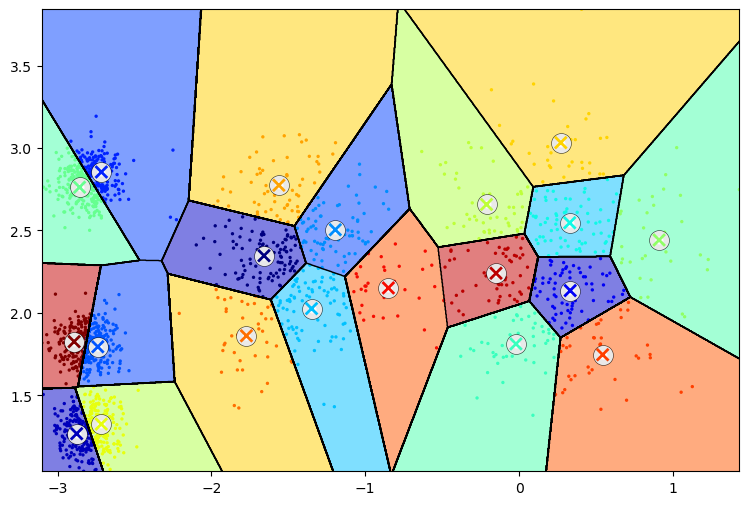

In [20]:
#Plot:
fig, ax1 = plt.subplots(1,1, figsize=(9,6))

plot_contour(ax1, X, kmeans, N=1500)
ax1.scatter(X[:,0], X[:,1], s=2, c=y_pred, cmap='jet');
plot_centroids(ax1, kmeans.cluster_centers_)

## Choosing $k$

### Inertia and the elbow

- Let' plot inertia as a function of $k$
- Recall that **inertia** = sum of the squared distances between each training instance and its closest centroid
- Look for the elbow...

In [21]:
## First just examine for a single k-means model:
k = 5
kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
kmeans.fit(X)

kmeans.inertia_

213.4217713125892

In [22]:
##And score is negative inertia: Need larger values (i.e. less negative) to mean a better score
kmeans.score(X)

-213.4217713125892

In [23]:
## Now loop and save inertia
## Use list comprehension: From Geron

#Recall that fit returns self, so we get a fit model:
k_max = 10
kmeans_models = [KMeans(n_clusters=k, n_init=10, random_state=42).fit(X)
                 for k in range(1, k_max+1)]

#Get the inertias:
inertias = [model.inertia_ for model in kmeans_models]


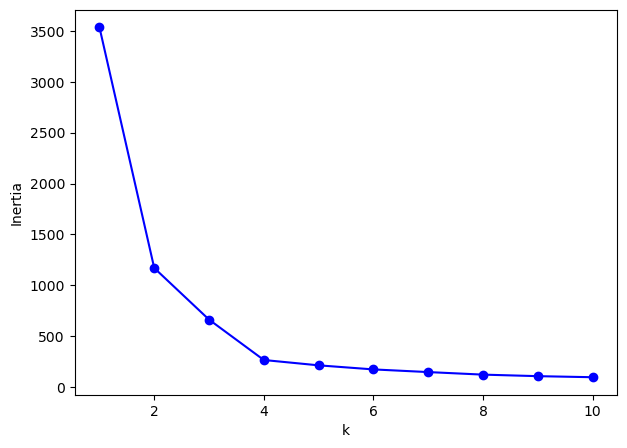

In [24]:
#Plot:
fig, ax1 = plt.subplots(1,1, figsize=(7,5))

ax1.plot(range(1, k_max+1), inertias, "bo-")

ax1.set_xlabel('k')
ax1.set_ylabel('Inertia');

### Silhouette Score

- **Silhouette Coefficient** for each instance is:
$$
\frac{(b - a)}{\max{(a, b)}}
$$

    - where $a$ is the mean distance to the other instances in the same cluster (i.e., mean *intra-cluster* distance)
    - $b$ is the mean distance to the instances of the next closest cluster (i.e., mean *nearest-cluster* distance)
    
Ranges $[-1, 1]$.

    - Score near +1 implies well within cluster
    - Score near 0 implies near border
    - Score near -1 implies misclustering


**Silhouette Score** = Mean of all silhouette coefficients


In [25]:
from sklearn.metrics import silhouette_score

In [26]:
#For model above:
silhouette_score(X, kmeans.labels_)

0.656578194104489

In [27]:
##Get the silhouette scores for our model list:
## Skip first model with k = 1, as only one cluster:

scores = [silhouette_score(X, model.labels_) for model in kmeans_models[1:]]

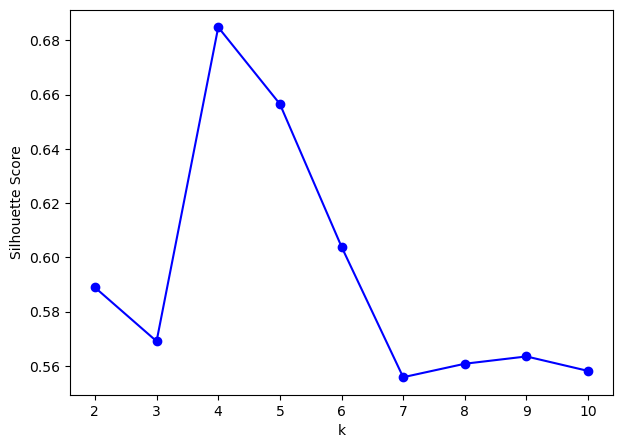

In [28]:
#Plot:
fig, ax1 = plt.subplots(1,1, figsize=(7,5))

ax1.plot(range(2, k_max+1), scores, "bo-")

ax1.set_xlabel('k')
ax1.set_ylabel('Silhouette Score');

### Silhouette Plot:

Plot observations by score and cluster membership as follows:

For a single model:

(0.0, 1.0)

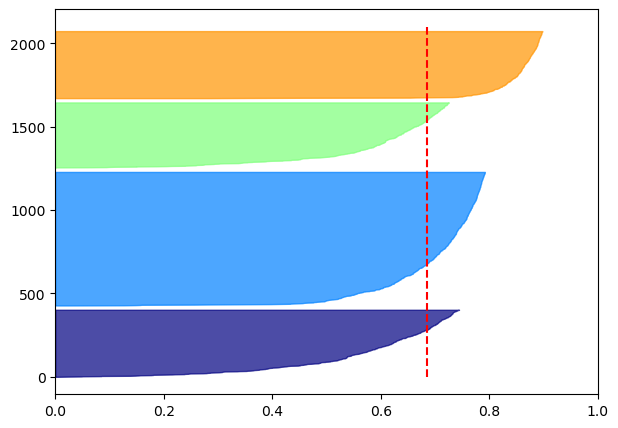

In [29]:
from sklearn.metrics import silhouette_samples


#For a single model:
k = 4
model = kmeans_models[k-1]

#Get the labels:
y_pred = model.labels_

#And the silhouette coefficients, courtesy of sk-learn:
silhouette_coefficients = silhouette_samples(X, y_pred)


fig, ax1 = plt.subplots(1,1, figsize=(7,5))

y_start = 0
#Iterate through the clusters:
for i in range(k):
    #Get all the silhouette coefficients for this cluster:
    coeffs = silhouette_coefficients[y_pred == i]

    #And sort
    coeffs.sort()

    #Get a color corresponding to this cluster:
    color = plt.cm.jet(i / k)


    #Arguments are y, x1, x2
    ax1.fill_betweenx(np.arange(y_start, y_start + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)

    #Advance the y_start
    y_start += len(coeffs)
    
    #Add a pad:
    y_start += 25
    
    
#Add overall average silhouette score:
sc = silhouette_score(X, model.labels_)
ax1.vlines(x=sc, ymin=0, ymax=y_start, color="red", linestyle="--")

ax1.set_xlim([0, 1])

In [30]:
### Now make a function so we can do for multiple models easily:
def plot_model_silhouettes(ax, model, X):
    
    from sklearn.metrics import silhouette_samples

    #Get the labels:
    y_pred = model.labels_

    #And the silhouette coefficients, courtesy of sk-learn:
    silhouette_coefficients = silhouette_samples(X, y_pred)


    y_start = 0
    #Iterate through the clusters:
    for i in range(k):
        #Get all the silhouette coefficients for this cluster:
        coeffs = silhouette_coefficients[y_pred == i]

        #And sort
        coeffs.sort()

        #Get a color corresponding to this cluster:
        color = plt.cm.jet(i / k)


        #Arguments are y, x1, x2
        ax.fill_betweenx(np.arange(y_start, y_start + len(coeffs)), 0, coeffs,
                              facecolor=color, edgecolor=color, alpha=0.7)

        #Advance the y_start
        y_start += len(coeffs)

        #Add a pad:
        y_start += 25


    #Add overall average silhouette score:
    sc = silhouette_score(X, model.labels_)
    ax.vlines(x=sc, ymin=0, ymax=y_start, color="red", linestyle="--")

    ax.set_xlim([0, 1])


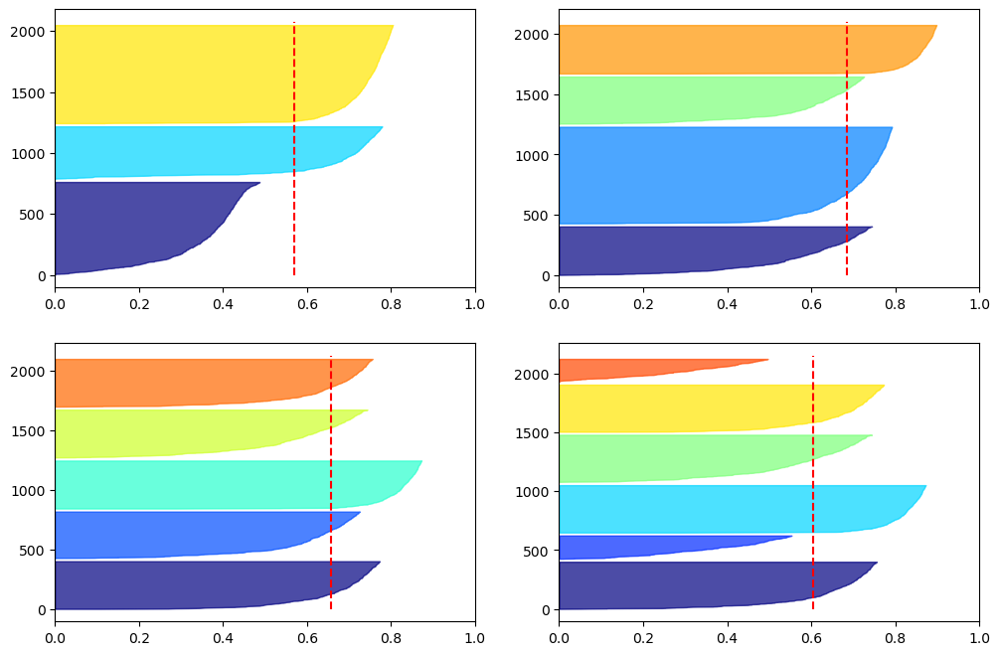

In [31]:
##Plot for models with k=3 through 6:

fig, ax1 = plt.subplots(2,2, figsize=(12,8))
ax1 = ax1.flatten()

for i, k in enumerate(range(3,7)):
    
    model = kmeans_models[k-1]
    
    plot_model_silhouettes(ax1[i], model, X)

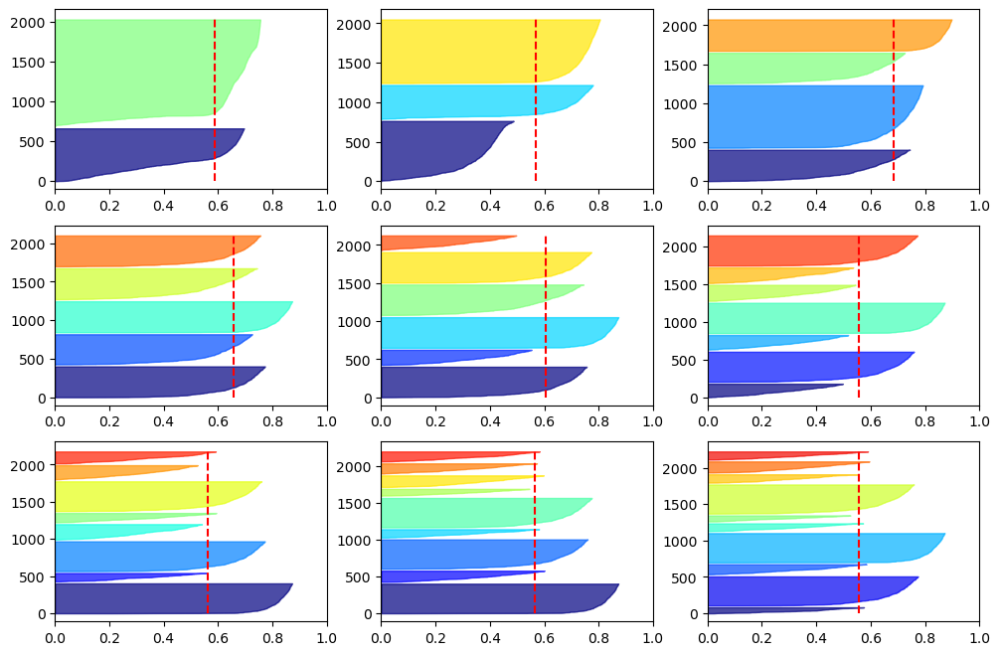

In [32]:
##Plot for models with k=2 through 9:

fig, ax1 = plt.subplots(3,3, figsize=(12,8))
ax1 = ax1.flatten()

for i, k in enumerate(range(2,11)):
    
    model = kmeans_models[k-1]
    
    plot_model_silhouettes(ax1[i], model, X)

## Application: Image Color Segmentation

- Let us segment a simple little image

In [33]:
import PIL

fp = 'ladybug.png'

image = np.asarray(PIL.Image.open(fp))
image.shape

(533, 800, 3)

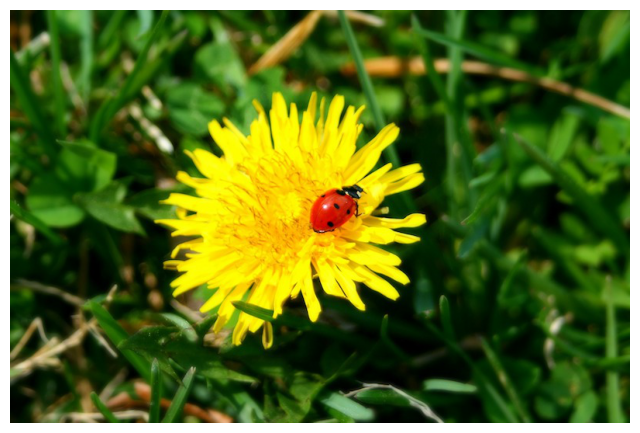

In [34]:
#Look at our ladybug picture:
fig, ax1 = plt.subplots(1,1, figsize=(8,8))

ax1.imshow(image);
ax1.set_axis_off()

In [35]:
#Change the dimension of our image:
X = image.reshape(-1, 3)
X

array([[25, 29,  2],
       [24, 28,  1],
       [24, 29,  0],
       ...,
       [10, 58,  0],
       [ 5, 52,  0],
       [ 2, 48,  0]], dtype=uint8)

In [36]:
#Use k_means to get our cluster centers:
######
k = 8

kmeans = KMeans(n_clusters=k, n_init=10, random_state=42).fit(X)


In [37]:
#Cluster centers give our RGB:
kmeans.cluster_centers_

array([[  5.6105612 ,  27.61743918,   1.44857047],
       [250.68280046, 237.8319458 ,   6.51237711],
       [ 54.37997208,  97.09151272,  14.07131629],
       [155.1122467 , 160.29920705,  98.37997063],
       [ 93.53208815, 132.47927103,  39.06947451],
       [ 24.39502109,  63.41611633,   4.09118396],
       [195.12454743,  50.81607531,  11.20057929],
       [223.40683449, 182.94424185,   9.39848253]])

In [38]:
#Convert to numpy and divide by 255:
segment_colors = np.array(kmeans.cluster_centers_) / 255
segment_colors

array([[0.0220022 , 0.10830368, 0.00568067],
       [0.98306981, 0.9326743 , 0.02553873],
       [0.21325479, 0.38075103, 0.05518163],
       [0.60828332, 0.62862434, 0.38580381],
       [0.3667925 , 0.51952655, 0.15321363],
       [0.09566675, 0.24869065, 0.01604386],
       [0.7651943 , 0.19927873, 0.04392384],
       [0.87610523, 0.7174284 , 0.03685679]])

<BarContainer object of 8 artists>

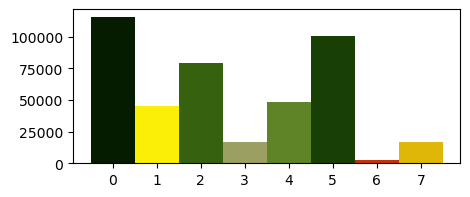

In [39]:
##Plot the colors real quick:
fig, ax1 = plt.subplots(1,1, figsize=(5,2))

#And let's actually look the membership of each color:
labels, counts = np.unique(kmeans.labels_, return_counts=True)

ax1.bar(range(0,k), counts, color=segment_colors, width=1)
#Or just ones:
#ax1.bar(range(0,k), np.ones(k), color=segment_colors, width=1)


In [40]:
#Grab the colors for each observation:
segment_colors[kmeans.labels_]


array([[0.0220022 , 0.10830368, 0.00568067],
       [0.0220022 , 0.10830368, 0.00568067],
       [0.0220022 , 0.10830368, 0.00568067],
       ...,
       [0.09566675, 0.24869065, 0.01604386],
       [0.09566675, 0.24869065, 0.01604386],
       [0.0220022 , 0.10830368, 0.00568067]])

In [41]:
#Put as our segmented image and reshape back to original image size:
####

segmented_image = segment_colors[kmeans.labels_]
segmented_image = segmented_image.reshape(image.shape)

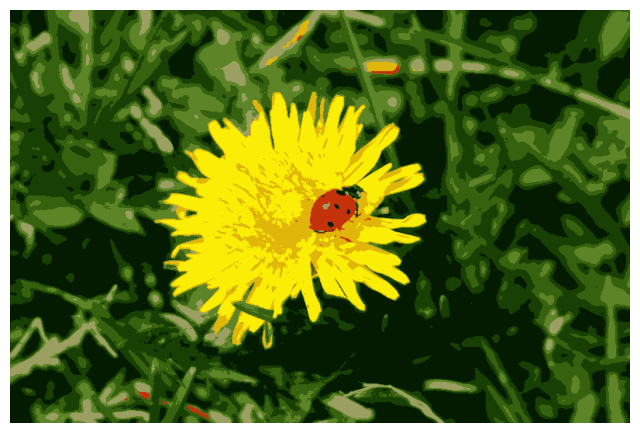

In [42]:
#Plot result:
fig, ax1 = plt.subplots(1,1, figsize=(8,8))

ax1.imshow(segmented_image)
ax1.set_axis_off()

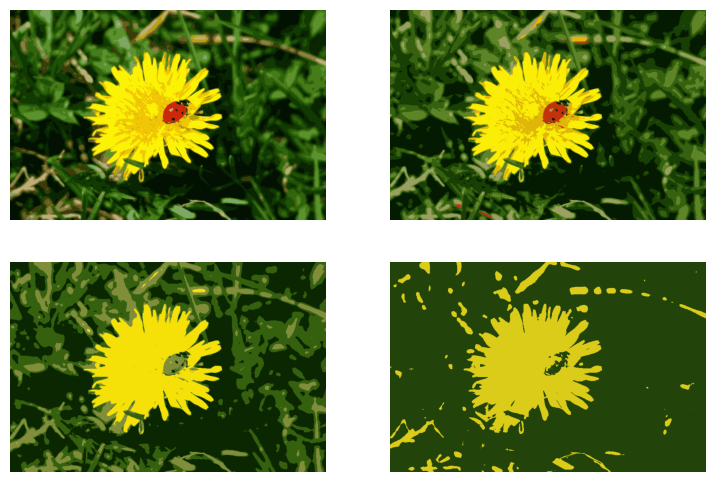

In [43]:
## Show results for different numbers of clusters:
###########

fig, ax1 = plt.subplots(2,2, figsize=(9,6))
ax1 = ax1.flatten()

k_list = [16, 8, 4, 2]

for i, k in enumerate(k_list):
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42).fit(X)
    
    #Colors
    segment_colors = np.array(kmeans.cluster_centers_) / 255
    
    #Get segmented image
    segmented_image = segment_colors[kmeans.labels_]
    segmented_image = segmented_image.reshape(image.shape)

    #Plot:
    ax1[i].imshow(segmented_image)
    ax1[i].set_axis_off()
    

## Try on Satellite Imagery

- Get some Landsat-8 Data...

- We'll use the `xarray`, `rioxarray`, and `earthpy` libraries

In [44]:
import xarray as xr
import rioxarray as rxr
import earthpy.plot as ep

## Landsat Data

- Can get data data through EarthExplorer (need to sign up for free): https://earthexplorer.usgs.gov/

- We'll get the following collection: **LC08_L1TP_037037_20230801_20230805_02_T1**


---

From USGS: https://www.usgs.gov/faqs/what-naming-convention-landsat-collections-level-1-scenes

### What is the naming convention for Landsat Collections Level-1 scenes? 

The Landsat Collection 1 Level-1 product identifier includes the Collection processing levels, processing date, collection number, and collection tier category:

LXSS_LLLL_PPPRRR_YYYYMMDD_yyyymmdd_CC_TX

Where:

    L = Landsat
    X = Sensor ("C"=OLI/TIRS combined, "O"=OLI-only, "T"=TIRS-only, "E"=ETM+, "T"=TM, "M"=MSS)
    SS = Satellite ("07"=Landsat 7, "08"=Landsat 8)
    LLLL = Processing correction level (L1TP/L1GT/L1GS)
    PPP = WRS path
    RRR = WRS row
    YYYYMMDD = Acquisition year, month, day
    yyyymmdd - Processing year, month, day
    CC = Collection number (01, 02, ...)
    TX = Collection category ("RT"=Real-Time, "T1"=Tier 1, "T2"=Tier 2)

Example:  LC08_L1GT_029030_20151209_20160131_01_RT

Means: Landsat 8; OLI/TIRS combined; processing correction level L1GT; path 029; row 030; acquired December 9, 2015; processed January 31, 2016; Collection 1; Real-Time

## Landsat Bands

For complete information on bands across Landsat series: https://www.usgs.gov/faqs/what-are-band-designations-landsat-satellites

For Landsat 8/9:

| Bands                                | Wavelength  			(micrometers) | Resolution  			(meters) |   |   |
|:--------------------------------------|:-------------------------|:--------------------|---|---|
| Band 1 - Coastal aerosol             | 0.43-0.45                 | 30                   |   |   |
| Band 2 - Blue                        | 0.45-0.51                 | 30                   |   |   |
| Band 3 - Green                       | 0.53-0.59                 | 30                   |   |   |
| Band 4 - Red                         | 0.64-0.67                 | 30                   |   |   |
| Band 5 - Near Infrared (NIR)         | 0.85-0.88                 | 30                   |   |   |
| Band 6 - Shortwave Infrared (SWIR) 1  &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp;&nbsp; &nbsp; &nbsp;&nbsp; &nbsp; | 1.57-1.65                 | 30                   |   |   |
| Band 7 - Shortwave Infrared (SWIR) 2 | 2.11-2.29                 | 30                   |   |   |
| Band 8 - Panchromatic                | 0.50-0.68                 | 15                   |   |   |
| Band 9 - Cirrus                      | 1.36-1.38                 | 30                   |   |   |
| Band 10 - Thermal Infrared (TIRS) 1  | 10.6-11.19                | 100                  |   |   |
| Band 11 - Thermal Infrared (TIRS) 2  | 11.50-12.51               | 100                  |   |   |

## Load our Landsat Data

- Let's get the following scene from EarthExplorer: **LC08_L1TP_037037_20230801_20230805_02_T1**

- Our resolution is 30 meters

- CRS is UTM 12

Let's start by getting bands 2, 3, 4, and 5:

- 2 = Blue
- 3 = Green
- 4 = Red
- 5 = IR

In [451]:
#Could do all this in a loop, but let's just be explicit:
#########

fp1 = 'Landsat_Data/LC08_L1TP_037037_20230801_20230805_02_T1_B2.TIF'
fp2 = 'Landsat_Data/LC08_L1TP_037037_20230801_20230805_02_T1_B3.TIF'
fp3 = 'Landsat_Data/LC08_L1TP_037037_20230801_20230805_02_T1_B4.TIF'
fp4 = 'Landsat_Data/LC08_L1TP_037037_20230801_20230805_02_T1_B5.TIF'

#Open with rioxarray:
band_1 = rxr.open_rasterio(fp1, masked=True).squeeze()
band_2 = rxr.open_rasterio(fp2, masked=True).squeeze()
band_3 = rxr.open_rasterio(fp3, masked=True).squeeze()
band_4 = rxr.open_rasterio(fp4, masked=True).squeeze()


In [453]:
band_1

<xarray.DataArray (y: 7891, x: 7751)>
[61163141 values with dtype=float32]
Coordinates:
    band         int32 1
  * x            (x) float64 2.409e+05 2.409e+05 ... 4.734e+05 4.734e+05
  * y            (y) float64 3.79e+06 3.79e+06 3.79e+06 ... 3.553e+06 3.553e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:  Point
    scale_factor:   1.0
    add_offset:     0.0

In [455]:
## Let's stack into a single xarray:
########
band_1['band'] = 0
band_2['band'] = 1
band_3['band'] = 2
band_4['band'] = 3

all_bands = xr.concat((band_1, band_2, band_3, band_4), dim="band")


In [456]:
all_bands

<xarray.DataArray (band: 4, y: 7891, x: 7751)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]], dtype=float32)
Coordinates:
  * band         (band) int32 1 1 1 1
  * x            (x) float64 2.409e+05 2.409e+05 ... 4.734e+05 4.734e+05
  * y            (y) float64 3.79e+06 3.79e+06 3.79e+06 ... 3.553e+06 3.553e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:  Point
    scale_factor:   1.0
    add_offset:     0.0

C:\Users\steff\Anaconda3\envs\ML_environment\lib\site-packages\earthpy\spatial.py:561: RuntimeWarning: invalid value encountered in cast
  return (bytedata.clip(low, high) + 0.5).astype("uint8")


<Axes: >

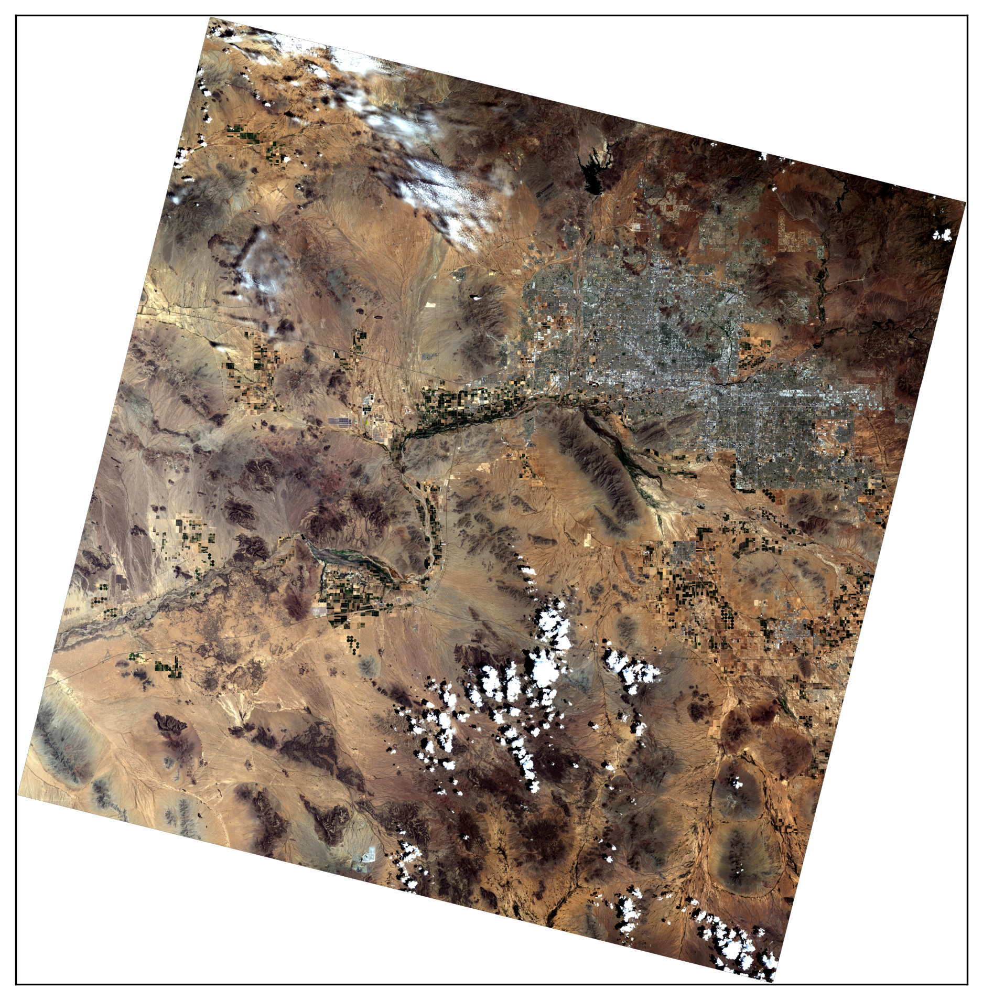

In [457]:
## A Quick Plot with EarthPy

fig, ax1 = plt.subplots(1,1, figsize=(12, 8), dpi=300)

##RGB Plot:
ep.plot_rgb(all_bands.values, rgb=[2,1,0], stretch=True, ax=ax1)


In [838]:
upscale_factor = 1/8

#Caluculate new height and width using upscale_factor
new_width = int(all_bands.rio.width * upscale_factor)
new_height = int(all_bands.rio.height * upscale_factor)

In [839]:
### Let's downsample in the interest of speed:
##############
from rasterio.enums import Resampling

all_bands_ds = all_bands.rio.reproject(all_bands.rio.crs, shape=(new_height, new_width), resampling=Resampling.bilinear)


C:\Users\steff\Anaconda3\envs\ML_environment\lib\site-packages\earthpy\spatial.py:561: RuntimeWarning: invalid value encountered in cast
  return (bytedata.clip(low, high) + 0.5).astype("uint8")


<Axes: >

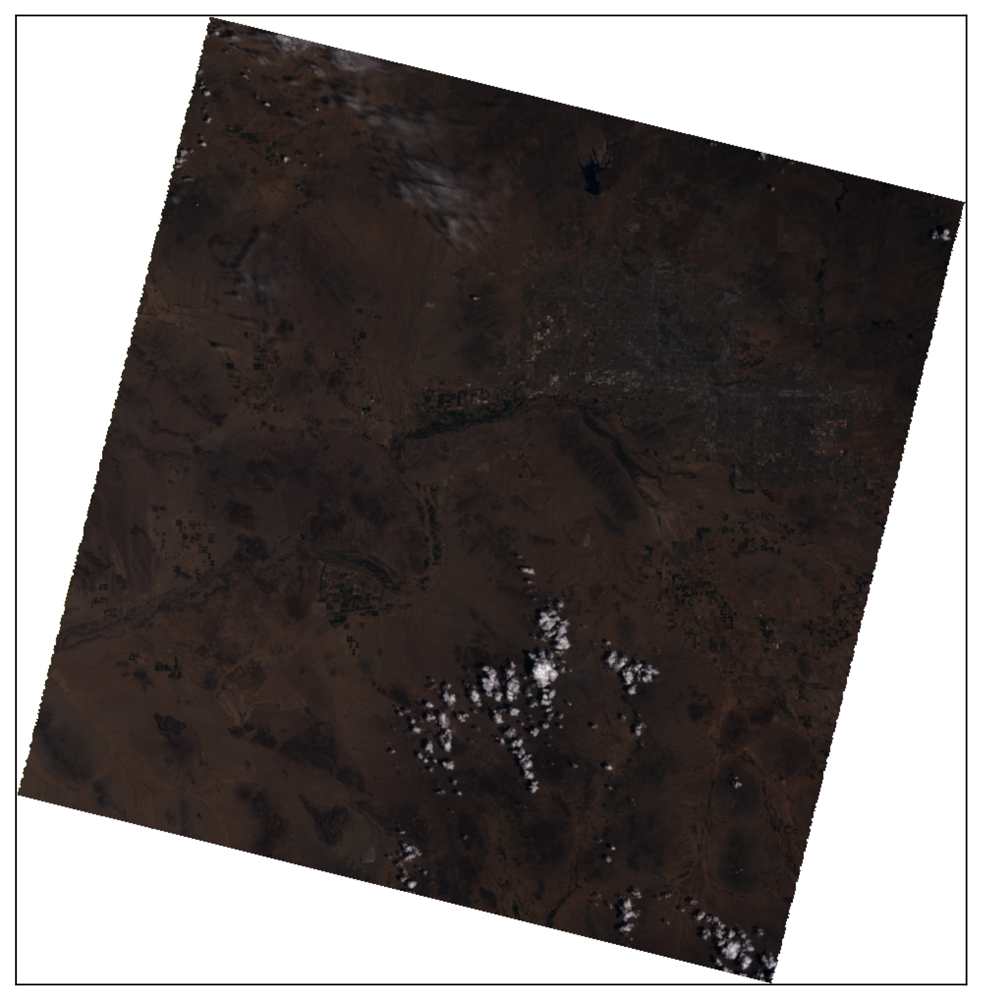

In [840]:
##Plot Again to Check:

fig, ax1 = plt.subplots(1,1, figsize=(12, 8), dpi=300)

##RGB Plot:
ep.plot_rgb(all_bands_ds.values, rgb=[2,1,0], stretch=False, ax=ax1)


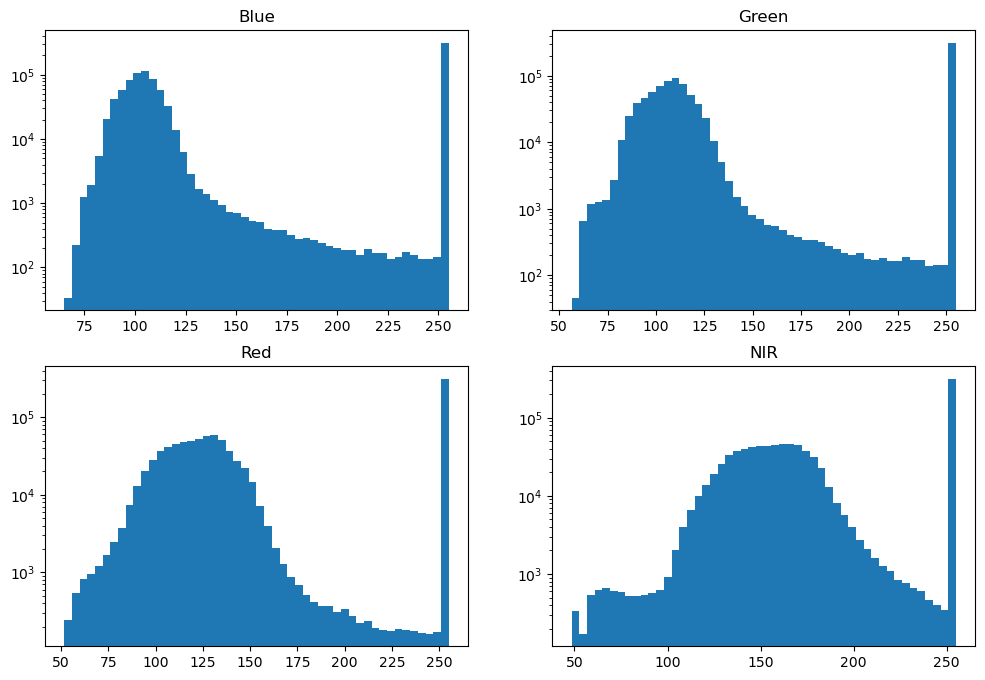

In [841]:

########
#Fill what doesn't get selected with our max_value:
max_value = 30e3

all_bands_stretch = all_bands_ds.where(all_bands_ds < max_value).fillna(max_value)

########


##New RGB histograms:
########
fig, ax1 = plt.subplots(2,2, figsize=(12, 8))

ax1 = ax1.flatten()

title_list = ['Blue', 'Green', 'Red', 'NIR']

#Plot the histogram normalized to a max of 255
for i in range(4):
    (all_bands_stretch[i] * 255 / all_bands_stretch[i].max()).plot.hist(ax=ax1[i], bins=50, log='y')
    #all_bands_stretch[i].plot.hist(ax=ax1[i], bins=50, log='y')
    ax1[i].set_title(title_list[i])

In [842]:
all_bands_stretch = np.log(all_bands_stretch)

<Axes: >

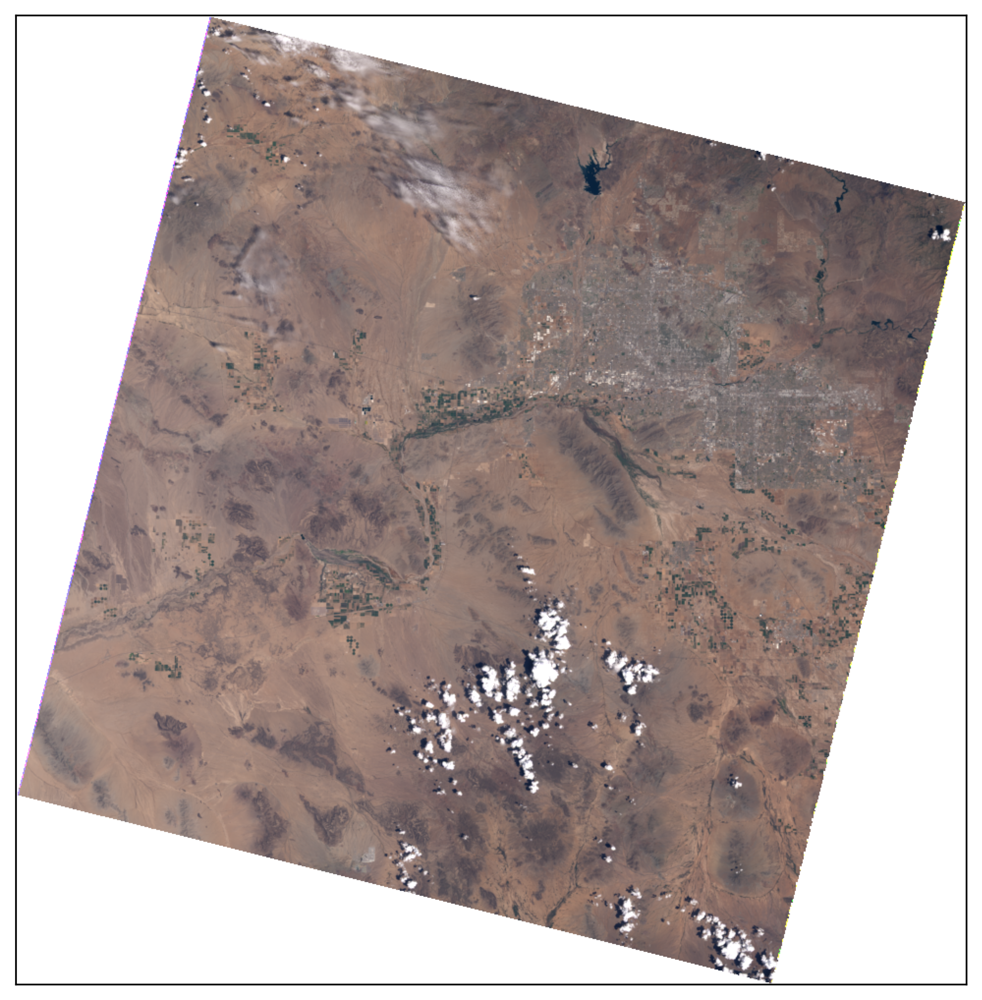

In [843]:
## Plot the stretched/clipped version
#########

fig, ax1 = plt.subplots(1,1, figsize=(12, 8), dpi=300)

##RGB Plot:
ep.plot_rgb(all_bands_stretch.values, rgb=[2,1,0], stretch=False, ax=ax1)

### Repeat from above:

In [844]:
all_bands_ds.values.transpose(1,2,0).shape

num_dim = 4
X_base = all_bands_stretch[:num_dim,:,:].fillna(0).values.transpose(1,2,0)

In [845]:
#Change the dimension of our image:
X = X_base.reshape(-1, num_dim)
X

array([[10.308952, 10.308952, 10.308952, 10.308952],
       [10.308952, 10.308952, 10.308952, 10.308952],
       [10.308952, 10.308952, 10.308952, 10.308952],
       ...,
       [10.308952, 10.308952, 10.308952, 10.308952],
       [10.308952, 10.308952, 10.308952, 10.308952],
       [10.308952, 10.308952, 10.308952, 10.308952]], dtype=float32)

In [871]:
#Use k_means to get our cluster centers:
######
k = 8

kmeans = KMeans(n_clusters=k, n_init=10).fit(X)


In [872]:
np.array(kmeans.cluster_centers_)

array([[ 9.42622 ,  9.47347 ,  9.619126,  9.852465],
       [10.308493, 10.307622, 10.308104, 10.308669],
       [ 9.369898,  9.384759,  9.491397,  9.726579],
       [ 9.278023,  9.262902,  9.342793,  9.595677],
       [ 9.274011,  9.287281,  9.294835, 10.036734],
       [ 9.893244,  9.822744,  9.936169, 10.071698],
       [ 9.506342,  9.574048,  9.737187,  9.947519],
       [ 9.145599,  9.033688,  8.999554,  9.040137]], dtype=float32)

In [873]:
#Convert to numpy and divide by Max:
segment_colors = (np.array(kmeans.cluster_centers_) - np.array(kmeans.cluster_centers_).min(axis=0)) / (np.array(kmeans.cluster_centers_).max(axis=0) - np.array(kmeans.cluster_centers_).min(axis=0))

segment_colors

array([[0.2413124 , 0.3452157 , 0.47348034, 0.64036816],
       [1.        , 1.        , 1.        , 1.        ],
       [0.19287968, 0.2755804 , 0.37586892, 0.54113066],
       [0.11387408, 0.17992659, 0.26230547, 0.43793944],
       [0.11042397, 0.1990632 , 0.22565545, 0.78562975],
       [0.64291745, 0.6193857 , 0.7157656 , 0.8131928 ],
       [0.31021124, 0.42416662, 0.5637032 , 0.715301  ],
       [0.        , 0.        , 0.        , 0.        ]], dtype=float32)

<BarContainer object of 8 artists>

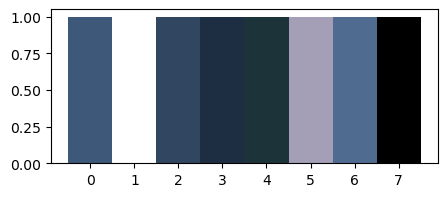

In [874]:
##Plot the colors real quick:
fig, ax1 = plt.subplots(1,1, figsize=(5,2))

#And let's actually look the membership of each color:
labels, counts = np.unique(kmeans.labels_, return_counts=True)

#ax1.bar(range(0,k), counts, color=segment_colors[:,:3], width=1)
#Or just ones:
ax1.bar(range(0,k), np.ones(k), color=segment_colors[:,:3], width=1)


In [875]:
#Grab the colors for each observation:
segment_colors[kmeans.labels_]


array([[1., 1., 1., 1.],
       [1., 1., 1., 1.],
       [1., 1., 1., 1.],
       ...,
       [1., 1., 1., 1.],
       [1., 1., 1., 1.],
       [1., 1., 1., 1.]], dtype=float32)

In [876]:
#Put as our segmented image and reshape back to original image size:
####

segmented_image = segment_colors[kmeans.labels_]
segmented_image = segmented_image.reshape(X_base.shape)

<Axes: >

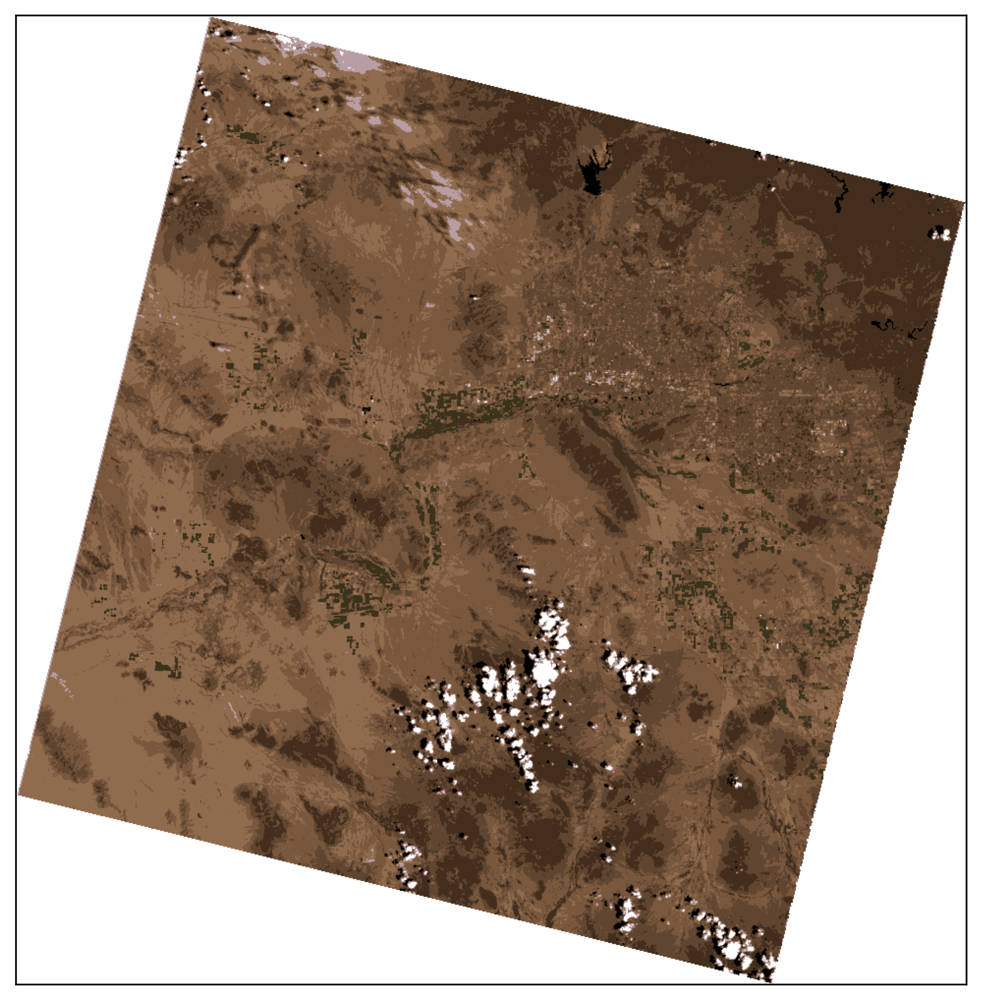

In [877]:
fig, ax1 = plt.subplots(1,1, figsize=(12, 8), dpi=300)

##RGB Plot:
ep.plot_rgb(segmented_image.transpose(2,0,1), rgb=[2,1,0], stretch=False, ax=ax1)

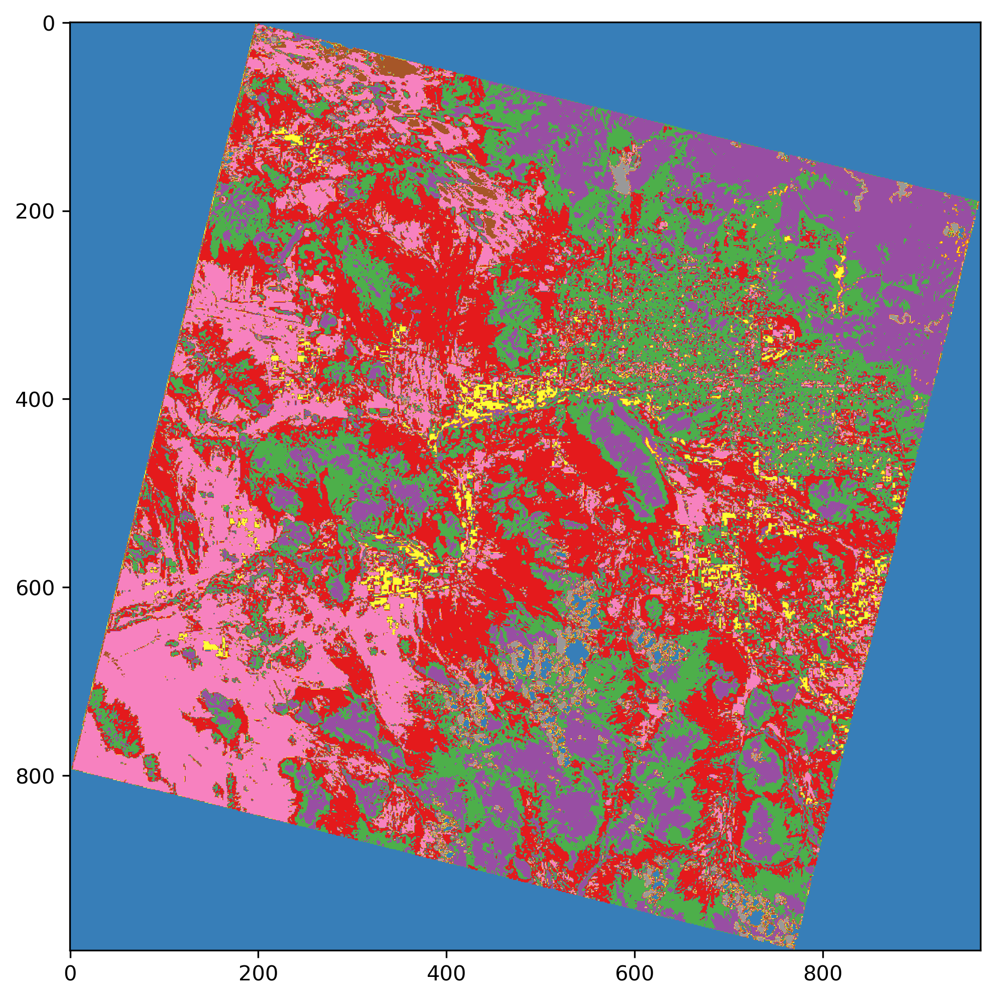

In [886]:
fig, ax1 = plt.subplots(1,1, figsize=(12, 8), dpi=300)

plt.imshow(kmeans.labels_.reshape(X_base.shape[:2]), cmap='Set1')

## k-means for Semi-supervised Learning

- Suppose we only have a few of our training instances labelled
- What to do?!
- Start with a simple example on blobs...

In [201]:
from sklearn.datasets import make_blobs

#Make two blobs:
blob_centers = np.array([[1, 1], [1.5, 2]])

blob_std = np.array([0.3, .7])

#X and y:
#y is blob membership
X, y = make_blobs(n_samples=1000, centers=blob_centers, cluster_std=blob_std,
                  random_state=42)

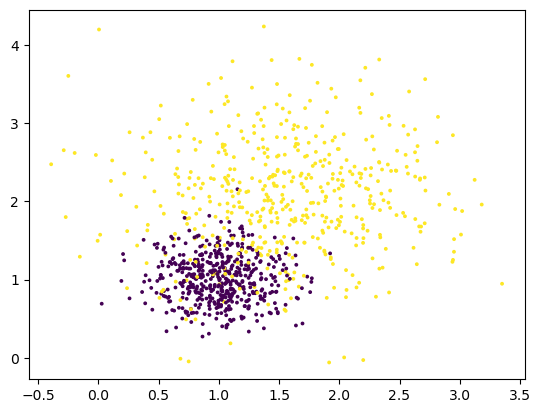

In [202]:
plt.scatter(X[:,0], X[:,1], s=3, c=y);

In [225]:
## Make our train/test split
######

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=123)
X_train


array([[0.11449013, 2.52353718],
       [1.52660243, 2.08402193],
       [1.01806906, 1.73897263],
       ...,
       [1.28070352, 1.38146653],
       [1.57294077, 1.95618481],
       [1.36036418, 0.87757739]])

In [236]:
#Now, suppose only a fraction of TRAINING instances are labelled:
n_labeled = 6

#Train a Logistic Regression Model:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

#Train one model on a fraction of data
model_small = LogisticRegression()
#Train another on all data for comparison 
model_full = LogisticRegression()

#Train on what is labelled:
model_small.fit(X_train[:n_labeled], y_train[:n_labeled])

#Train on full
model_full.fit(X_train, y_train)


LogisticRegression()

In [237]:
#How do we do on the test data?
model_full.score(X_test, y_test)

0.88

In [238]:
#How do we do on the test data?
#Not as well
model_small.score(X_test, y_test)

0.66

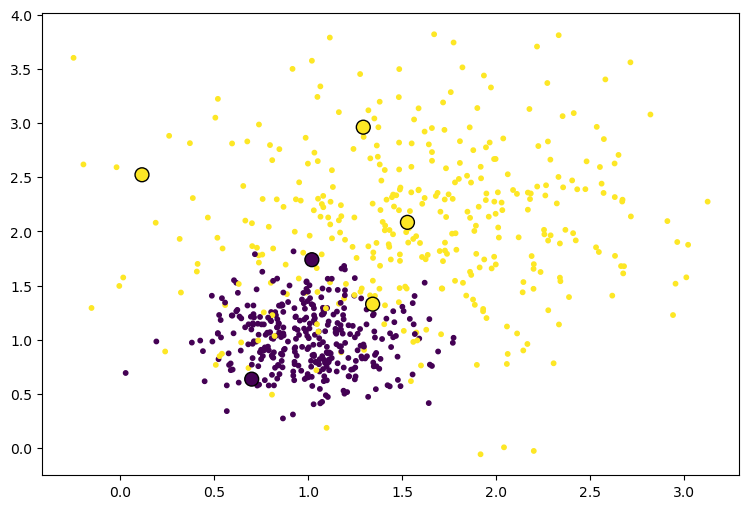

In [239]:
#What did we train on in reduced case?
#Check our blobs:
fig, ax1 = plt.subplots(1,1, figsize=(9,6))

#All data
ax1.scatter(X_train[:,0], X_train[:,1], s=10, c=y_train);

#Our labeled data
ax1.scatter(X_train[:n_labeled][:,0], X_train[:n_labeled][:,1], s=100, c=y_train[:n_labeled],
            edgecolor='black');

In [240]:
## Now let's cluster the data and determine label based on cluster membership
##############
kmeans = KMeans(n_clusters=2, n_init=10, random_state=42)

kmeans.fit(X_train)

#What did we get?
#Compare to our actual labels for mapping
kmeans.labels_

C:\Users\steff\Anaconda3\envs\ML_environment\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


array([1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1,
       0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0,
       0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1,
       1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1,
       1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0,

In [241]:
#Looks like they line up, so good to go:
y_train

array([1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1,
       0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1,
       1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0,
       0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1,
       1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0,
       1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1,
       1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0,

In [242]:
## Relabel our clusters:
y_train_propagated = kmeans.labels_

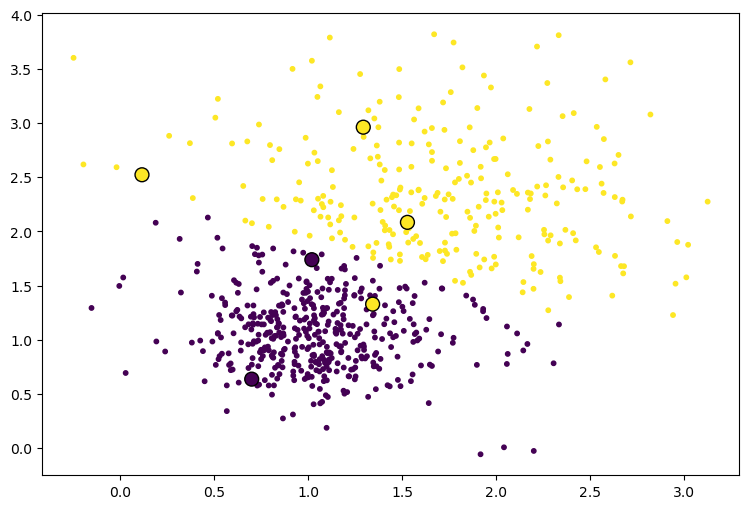

In [243]:
## And check:
fig, ax1 = plt.subplots(1,1, figsize=(9,6))

#All data with propagated labels
ax1.scatter(X_train[:,0], X_train[:,1], s=10, c=y_train_propagated);

#Our labeled data
ax1.scatter(X_train[:n_labeled][:,0], X_train[:n_labeled][:,1], s=100, c=y_train[:n_labeled],
            edgecolor='black');


In [244]:
## Fit on the propagated labels:
#Train on what is labelled:
model_small.fit(X_train, y_train_propagated)


LogisticRegression()

In [245]:
#Now how'd we do on the test data?
#Better!
model_small.score(X_test, y_test)

0.85

## k-means for Semi-supervised Learning on Numbers

- A more complex example on numbers
- We'll use a simpler set of numbers
- Can do on MNIST, but need more clusters, a little more tedious

In [246]:
#To get the MNIST numbers:

from keras.datasets import mnist
(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

## Just get a subset:
X_train = train_images.reshape(-1,28*28)
X_test = test_images.reshape(-1,28*28)

X_train = X_train[:5000]
y_train = train_labels[:5000]

X_test = X_test[:5000]
y_test = test_labels[:5000]


In [342]:
##Instead:

from sklearn.datasets import load_digits

images, labels = load_digits(return_X_y=True)
X_train, y_train = images[:1400], labels[:1400]
X_test, y_test = images[1400:], labels[1400:]


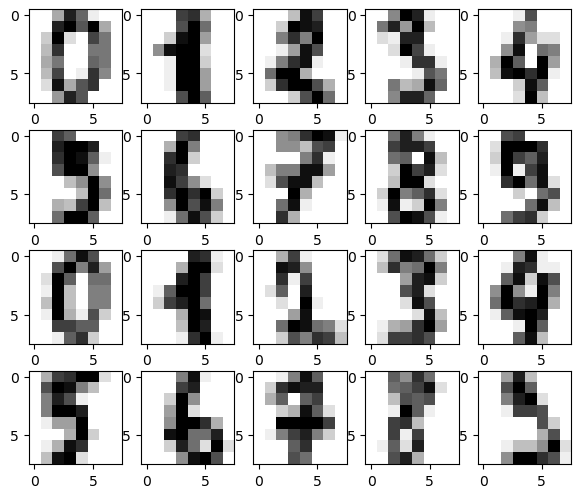

In [346]:
#Plot the first few train images:
#######

fig1, ax1 = plt.subplots(4, 5, figsize=(7,6))

#Flatten for easier indexing
ax1 = ax1.flatten()

#And plot:
for i in range(20):

    im = ax1[i].imshow(X_train[i].reshape(8,8), cmap='gray_r')
    

In [347]:
## Just follow our work above, suppose only a small subset of TRAINING data labelled:
############

n_labeled = 50

#Train a Logistic Regression Model:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

#Train one model on a fraction of data
model_small = LogisticRegression(max_iter=10000)
#Train another on all data for comparison 
model_full = LogisticRegression(max_iter=10000)

#Train on what is labelled:
model_small.fit(X_train[:n_labeled], y_train[:n_labeled])

#Train on full
model_full.fit(X_train, y_train)



LogisticRegression(max_iter=10000)

In [348]:
#Full data performance?
model_full.score(X_test, y_test)

0.906801007556675

In [349]:
#Reduced?
model_small.score(X_test, y_test)

0.7481108312342569

In [350]:
## Let's make 50 clusters:
##########
num_clusters = 50

kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)

kmeans.fit(X_train)

C:\Users\steff\Anaconda3\envs\ML_environment\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(


KMeans(n_clusters=50, n_init=10, random_state=42)

In [351]:
## Now, let's get the distance of each observation to each cluster center
## Lucky us, the transform method returns this:
X_distance = kmeans.transform(X_train)

X_distance

array([[39.2013243 , 51.61166593, 35.78092988, ..., 38.38114439,
        50.23366329, 39.12819457],
       [38.04484845, 32.68742517, 49.74639198, ..., 49.57935301,
        46.33618043, 40.98059968],
       [39.89248668, 41.45574598, 52.89107126, ..., 45.0884618 ,
        45.41881992, 38.78359351],
       ...,
       [47.70359228, 31.996892  , 53.95358402, ..., 51.32081966,
        58.66979688, 48.15773173],
       [46.20208562, 31.35143073, 53.34513581, ..., 51.42509909,
        58.40766568, 47.54535798],
       [35.79679446, 44.83906598, 47.16070489, ..., 47.4428765 ,
        54.8295814 , 39.67310178]])

In [352]:
## Let's get the single image closest to each centroid
## Gives 50 REPRESENTATIVE IMAGES

#Gives us the index for the representative digits
rep_digits_index = np.argmin(X_distance, axis=0)
rep_digits_index

array([ 816,  410, 1188,  468,  533,  692,  259,  877, 1178, 1309,  175,
        708, 1387,  932,  310,  991, 1312, 1250, 1005, 1114,  885, 1222,
        411,  543,  579,  141,  252, 1156, 1291,  870, 1168, 1050, 1383,
        959,  159,  881,  587,  251,  438,  520, 1198,  685,  983, 1295,
          2,  196, 1352,  908, 1159,  943], dtype=int64)

In [353]:
## And our digits:
X_rep_digits = X_train[rep_digits_index]


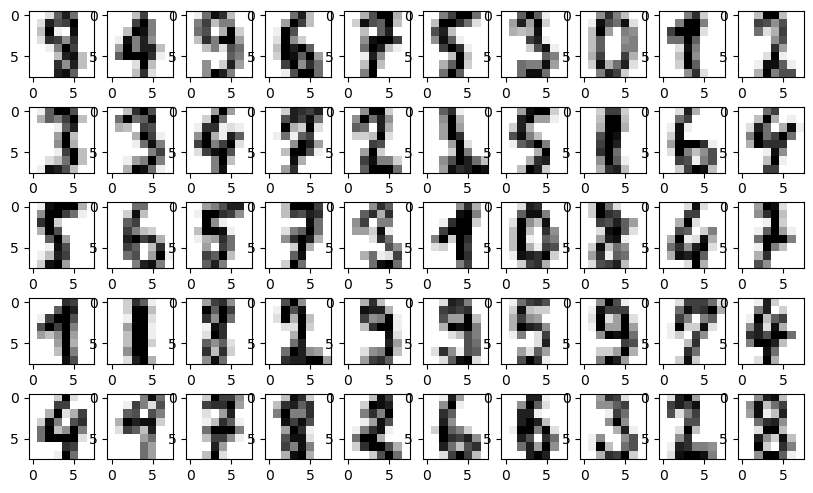

In [357]:
## Plot, and label manually:
#######

fig1, ax1 = plt.subplots(5, 10, figsize=(10,6))
ax1 = ax1.flatten()

#And plot:
for i in range(50):
    im = ax1[i].imshow(X_rep_digits[i].reshape(8,8), cmap='gray_r')
    

In [359]:
#(Actual truth)
y_train[rep_digits_index]

array([8, 4, 9, 6, 7, 5, 3, 0, 1, 2, 3, 3, 4, 7, 2, 1, 5, 1, 6, 4, 5, 6,
       5, 7, 3, 1, 0, 8, 4, 7, 1, 1, 8, 2, 9, 9, 5, 9, 7, 4, 4, 9, 7, 8,
       2, 6, 6, 3, 2, 8])

In [360]:
#Manual labels:
y_rep_digits = np.array([8,4,9,6,7,5,3,0,1,2,
                         3,3,4,7,2,1,5,1,6,4,
                         5,6,5,7,3,1,0,8,4,7,
                         1,1,8,2,9,9,5,9,7,4,
                         4,9,7,8,2,6,6,3,2,8])
    
#For MNIST
#y_rep_digits = np.array([8,7,1,8,0,4,4,4,3,1,6,0,8,3,7,4,6,7,2,7,
#                         8,0,6,6,8,6,2,9,2,0,3,5,0,9,9,3,0,9,4,5,
#                         7,7,7,4,8,2,1,2,2,0,6,1,3,8,5,9,2,6,2,5,
#                         7,9,5,6,7,6,3,9,8,1,0,4,3,9,7,3,1,8,0,4,
#                         1,6,0,2,7,9,5,0,7,3,4,4,3,0,6,2,3,4,6,6])

In [361]:
## Train model  using representative digits:
##########

#Train model using representative digits:
model_rep = LogisticRegression(max_iter=10000)


#Train on representative digits:
model_rep.fit(X_rep_digits, y_rep_digits)


LogisticRegression(max_iter=10000)

In [362]:
## And how did it do?
#Okay, better!
model_rep.score(X_test, y_test)


0.8413098236775819

In [363]:
## Now, propagate the labels
########
y_train_propagated = np.zeros(len(X_train), dtype=np.int64)

for i in range(num_clusters):
    y_train_propagated[kmeans.labels_ == i] = y_rep_digits[i]
    
y_train_propagated

array([0, 1, 2, ..., 4, 4, 7], dtype=int64)

In [364]:
##Train once again, using the propagated labels:
#####

#Train model using propagated digits:
model_prop = LogisticRegression(max_iter=10000)

model_prop.fit(X_train, y_train_propagated)


LogisticRegression(max_iter=10000)

In [365]:
## And final performance?
model_prop.score(X_test, y_test)

0.8639798488664987

In [366]:
#Cut out the observations furthest from any cluster center
#######

percentile_closest = 99

X_cluster_dist = X_distance[np.arange(len(X_train)), kmeans.labels_]
for i in range(k):
    in_cluster = (kmeans.labels_ == i)
    cluster_dist = X_cluster_dist[in_cluster]
    cutoff_distance = np.percentile(cluster_dist, percentile_closest)
    above_cutoff = (X_cluster_dist > cutoff_distance)
    X_cluster_dist[in_cluster & above_cutoff] = -1

partially_propagated = (X_cluster_dist != -1)
X_train_partially_propagated = X_train[partially_propagated]
y_train_partially_propagated = y_train_propagated[partially_propagated]

In [367]:
log_reg = LogisticRegression(max_iter=10000)
log_reg = RandomForestClassifier()
log_reg.fit(X_train_partially_propagated, y_train_partially_propagated)
log_reg.score(X_test, y_test)

0.8866498740554156